# Evaluating Tikhonet Trained

In this Notebook we are going to evaluate the performance of a [Tikhonet](https://arxiv.org/pdf/1911.00443.pdf) trained.

## Required Libraries and Functions

In [1]:
import os

#set cuda to run on CPU so VRAM is not an issue
#otherwise during loading model you get failed to get cuddn thing to load
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = ""

# Get the current working directory
current_directory = os.getcwd()

# Print it
print("Current working directory:", current_directory)

#check tf version
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

#check keras version
print(tf.keras.__version__)

#check python version
import sys
print(sys.version)

Current working directory: /home/acoundexist/Desktop/ShapeNetL1/evaluation


/home/acoundexist/.conda/envs/ShapeNetL1/lib/python3.7/site-packages/google/api_core/_python_version_support.py:237: FutureWarning: You are using a non-supported Python version (3.7.12). Google will not post any further updates to google.api_core supporting this Python version. Please upgrade to the latest Python version, or at least Python 3.10, and then update google.api_core.
  warnings.warn(message, FutureWarning)


TensorFlow version: 1.15.0
2.2.4-tf
3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:21) 
[GCC 9.4.0]


In [2]:
%matplotlib inline

# Add library path to PYTHONPATH
lib_path = '/home/ShapeNetL1/'
path_alphatransform = lib_path+'alpha-transform'
path_score = lib_path+'score'
sys.path.insert(0, path_alphatransform)
sys.path.insert(0, path_score)
data_path = '/home/data_dir_optical/'

model_dir = '/home/models/'

path_SUNet = "/home/SUNet/"

import sys
sys.path.insert(0, lib_path)
sys.path.insert(0, path_SUNet)
# Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import fft
import cadmos_lib as cl
#import tensorflow as tf
import galsim
from galsim import Image
import galsim.hsm
import pickle

## Load The Comparison Batch

In [3]:
f = open(data_path+"cfht_batch.pkl", "rb")
batch = pickle.load(f)
f.close()

## Load and Apply Trained Model on Batch

In [4]:
model_name = 'L2_ShapeNet'
# g: gamma (trade-off parameter of the shape constraint)
model_g05_name = 'L1_GAMMA0.0078125'

print(model_dir+model_name)


#load models
model = tf.keras.models.load_model(model_dir+model_name, compile=False)
model_g05 = tf.keras.models.load_model(model_dir+model_g05_name, compile=False)

res = model(np.expand_dims(batch['inputs_tikho'], axis=-1))
res_np = tf.keras.backend.eval(res)[...,0]
res_g05 = model_g05(np.expand_dims(batch['inputs_tikho'], axis=-1))
res_g05_np = tf.keras.backend.eval(res_g05)[...,0]


#LOAD SUNET
SUNet_g0 = np.load(path_SUNet+"SUNet.npy")

# generate the psfs in the spatial domain
psf_hst = np.fft.ifftshift(np.fft.irfft2(batch['psf_hst'][0]))
psf_tile_cfht = np.array([np.fft.ifftshift(np.fft.irfft2(p)) for p in batch['psf_cfht']])
# make psf tiles
psf_tile_hst = np.repeat(psf_hst[np.newaxis, :, :], batch['psf_hst'].shape[0], axis=0)
# psf_tile_cfht = np.repeat(psf_cfht[np.newaxis, :, :], k_batch*n_batch, axis=0)


/home/acoundexist/Desktop/thesis_publish/ShapeNet/models/L2_ShapeNet
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


2025-11-30 13:45:03.885300: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2025-11-30 13:45:03.938625: E tensorflow/stream_executor/cuda/cuda_driver.cc:318] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-11-30 13:45:03.938661: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: fedora
2025-11-30 13:45:03.938671: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: fedora
2025-11-30 13:45:03.938816: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 575.64.5
2025-11-30 13:45:03.938854: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:204] kernel reported version is: Not found: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  575.64.05  Release Build  (dvs-builder@U22-A23-13-1)  Fri Jul 18 16

### Flag Moments Measurement Failure

In [5]:
im_size = 64
scale = 0.1

def EllipticalGaussian(e1, e2, sig, xc=im_size//2, yc=im_size//2, stamp_size=(im_size,im_size)):
    # compute centered grid
    ranges = np.array([np.arange(i) for i in stamp_size])
    x = np.outer(ranges[0] - xc, np.ones(stamp_size[1]))
    y = np.outer(np.ones(stamp_size[0]),ranges[1] - yc)
    # shift it to match centroid
    xx = (1-e1/2)*x - e2/2*y
    yy = (1+e1/2)*y - e2/2*x
    # compute elliptical gaussian
    return np.exp(-(xx ** 2 + yy ** 2) / (2 * sig ** 2))

def get_moments(images, bool_window=False):
    g_list,error_flag_list=[],[]
    if bool_window:
        window_list = []
        window_flag_list = []
    for image in images:
        error_flag = True
        #create a galsim version of the data
        image_galsim = galsim.Image(image,scale=scale)
        #estimate the moments of the observation image
        shape = galsim.hsm.FindAdaptiveMom(image_galsim
                                         ,guess_centroid=galsim.PositionD(im_size//2,im_size//2)
                                         ,strict=False)
        if bool_window:
            k_sigma = 1.2 #scale up the size of the Gaussian window to make it able to capture more useful signal
            window = EllipticalGaussian(-1.*shape.observed_shape.e1, shape.observed_shape.e2 #convention fix:
                                                                                             #e1 sign swap
                                 ,shape.moments_sigma*k_sigma # convention fix: swap x and y and origin at (0,0)
                                 ,shape.moments_centroid.y-1, shape.moments_centroid.x-1
                                 ,image.shape)
            window_flag = bool(shape.moments_status+1)
        g = np.array([shape.observed_shape.g1, shape.observed_shape.g2])
        if shape.error_message:# or np.linalg.norm(shape.corrected_g1+shape.corrected_g2*1j)>1:
            error_flag = False
        error_flag_list += [error_flag]
        g_list += [g]
        if bool_window:
            window_list += [window]
            window_flag_list += [window_flag]
    output = [np.array(g_list).T,np.array(error_flag_list)]
    if bool_window:
        output += [np.array([window_list])[0],np.array([window_flag_list])[0]]
    return output


mom_hst,_,windows, window_flags = get_moments(batch['targets'],bool_window=True)

## Warning: Window Estimation Failures Are Filtered

As shown in the cell below, one third of the window estimation fail. As a first approach we tackle this problem by removing the failures from the analyzed data. 

In [6]:
print('Proportion of failed window estimations: {}'.format(1-window_flags.sum()/window_flags.size))

Proportion of failed window estimations: 0.359375


## Plot Successful Galaxy Images

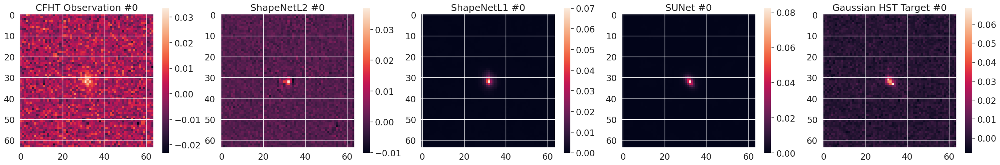

Max of CFHT 0.03356139
Max of ShapeNetL1 0.03692456
Max of ShapenetL2 0.070075855


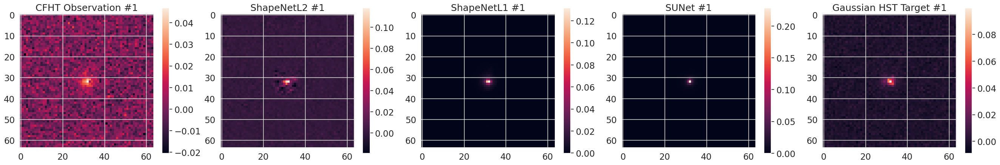

Max of CFHT 0.0468523
Max of ShapeNetL1 0.118073076
Max of ShapenetL2 0.13160498


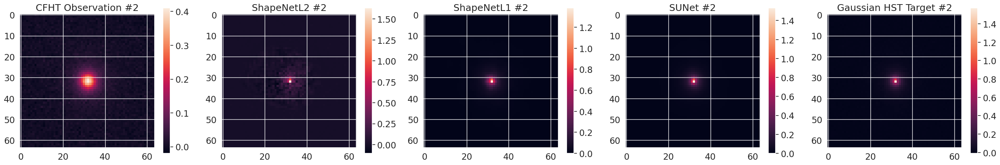

Max of CFHT 0.4103396
Max of ShapeNetL1 1.631187
Max of ShapenetL2 1.3833877


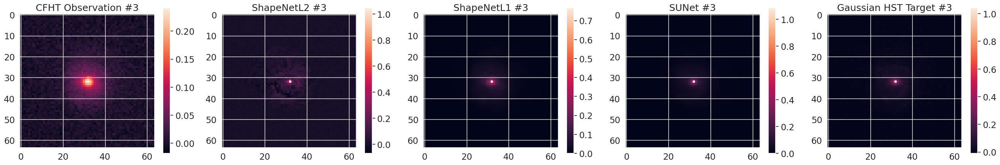

Max of CFHT 0.2413483
Max of ShapeNetL1 1.0471601
Max of ShapenetL2 0.766378


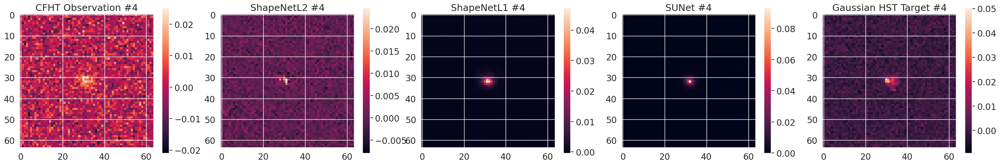

Max of CFHT 0.025142567
Max of ShapeNetL1 0.024660276
Max of ShapenetL2 0.04723091


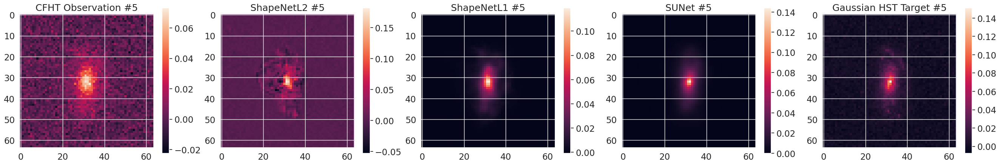

Max of CFHT 0.07312592
Max of ShapeNetL1 0.18161377
Max of ShapenetL2 0.119098276


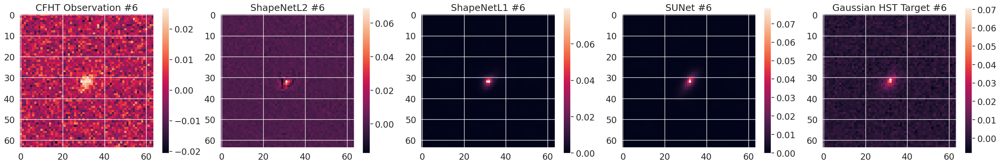

Max of CFHT 0.026828725
Max of ShapeNetL1 0.068929546
Max of ShapenetL2 0.07981798


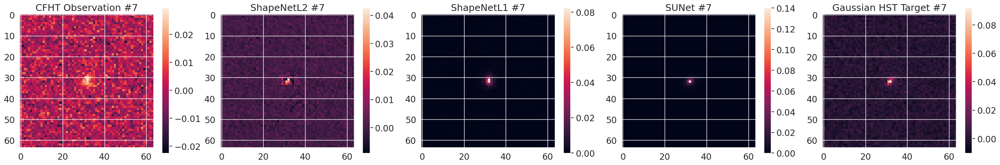

Max of CFHT 0.02941215
Max of ShapeNetL1 0.042618502
Max of ShapenetL2 0.08226949


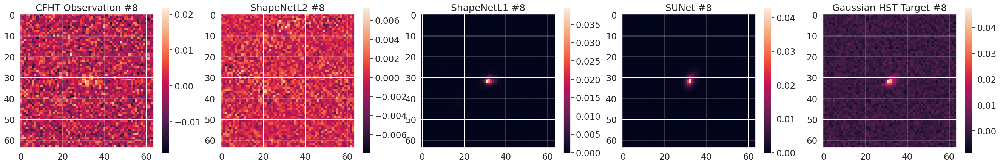

Max of CFHT 0.021730753
Max of ShapeNetL1 0.0072907633
Max of ShapenetL2 0.039387796


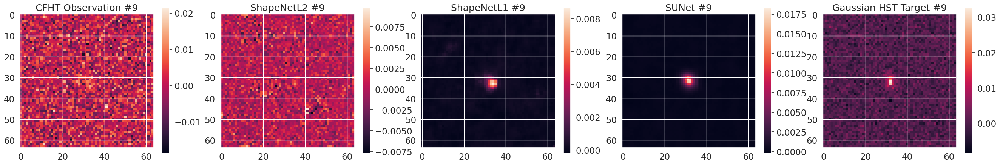

Max of CFHT 0.021390535
Max of ShapeNetL1 0.00975487
Max of ShapenetL2 0.008634721


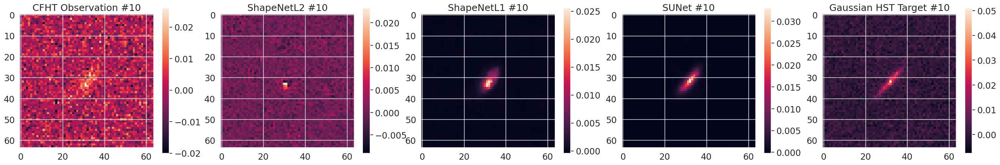

Max of CFHT 0.026030812
Max of ShapeNetL1 0.0232945
Max of ShapenetL2 0.025574008


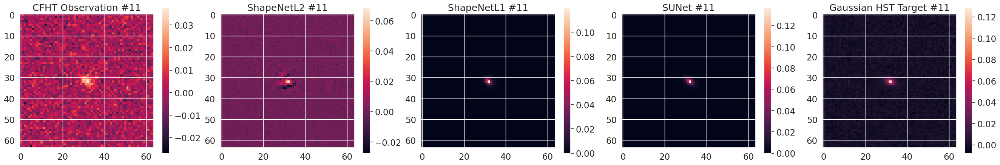

Max of CFHT 0.037597954
Max of ShapeNetL1 0.068490885
Max of ShapenetL2 0.11985962


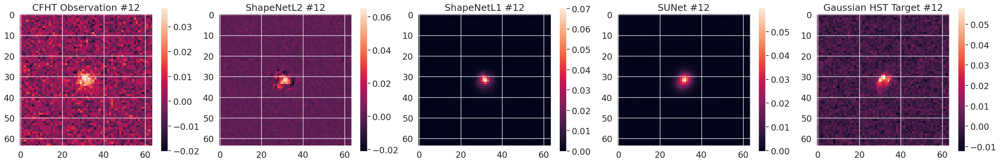

Max of CFHT 0.0375794
Max of ShapeNetL1 0.06540765
Max of ShapenetL2 0.07035002


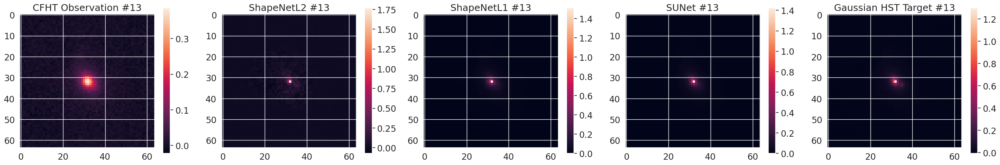

Max of CFHT 0.38585418
Max of ShapeNetL1 1.7688651
Max of ShapenetL2 1.5101296


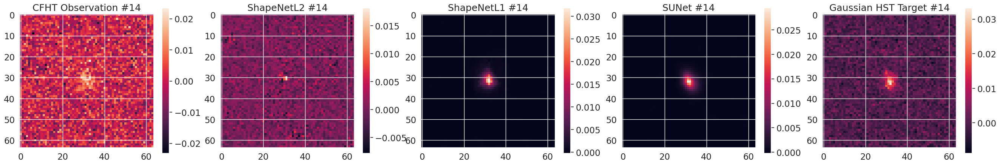

Max of CFHT 0.023455549
Max of ShapeNetL1 0.018142449
Max of ShapenetL2 0.03185954


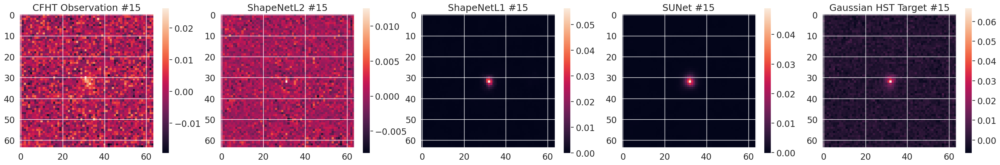

Max of CFHT 0.026260564
Max of ShapeNetL1 0.01260498
Max of ShapenetL2 0.056404576


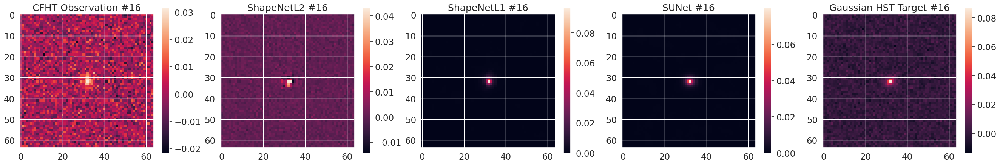

Max of CFHT 0.03147545
Max of ShapeNetL1 0.043122478
Max of ShapenetL2 0.09654516


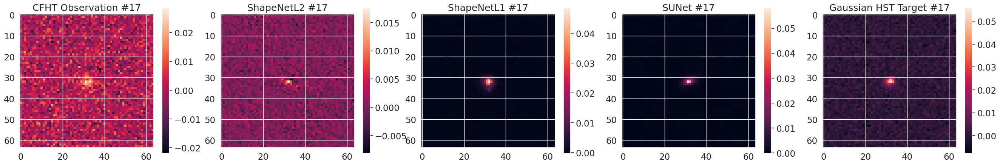

Max of CFHT 0.028558537
Max of ShapeNetL1 0.0175965
Max of ShapenetL2 0.04849181


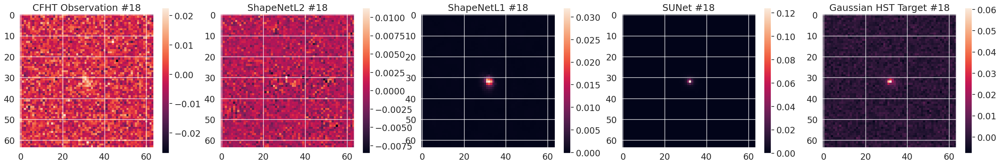

Max of CFHT 0.022588603
Max of ShapeNetL1 0.011286186
Max of ShapenetL2 0.031981155


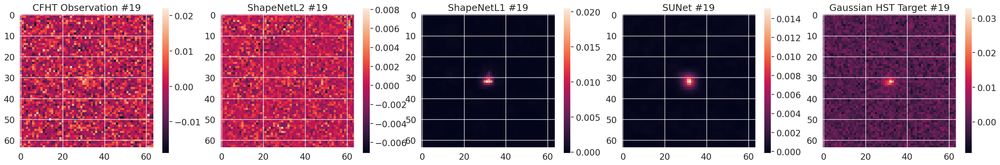

Max of CFHT 0.022145597
Max of ShapeNetL1 0.008156646
Max of ShapenetL2 0.020551274


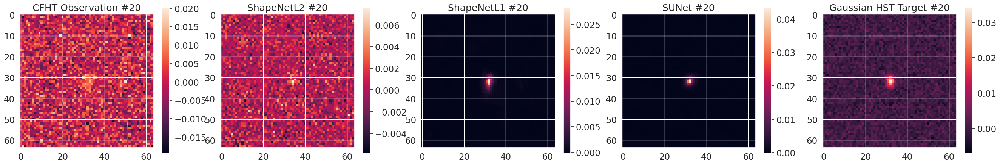

Max of CFHT 0.02006075
Max of ShapeNetL1 0.007547516
Max of ShapenetL2 0.028151687


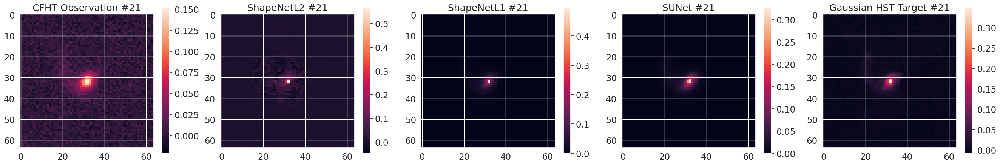

Max of CFHT 0.15125127
Max of ShapeNetL1 0.5653029
Max of ShapenetL2 0.49557143


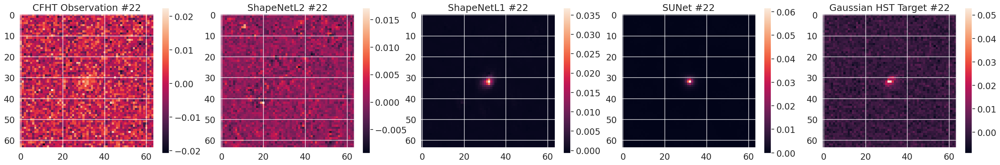

Max of CFHT 0.02243906
Max of ShapeNetL1 0.017102255
Max of ShapenetL2 0.03682657


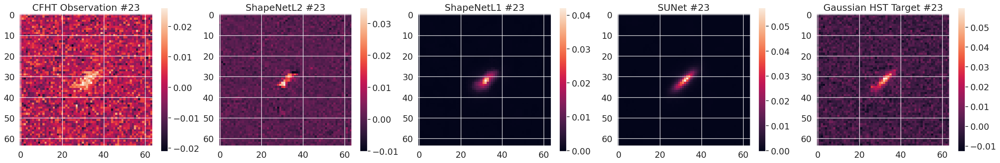

Max of CFHT 0.02609255
Max of ShapeNetL1 0.034884185
Max of ShapenetL2 0.04213247


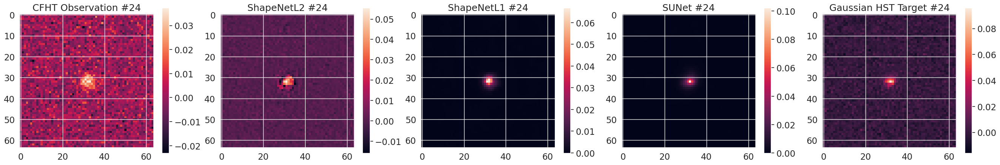

Max of CFHT 0.03731157
Max of ShapeNetL1 0.05545011
Max of ShapenetL2 0.06672312


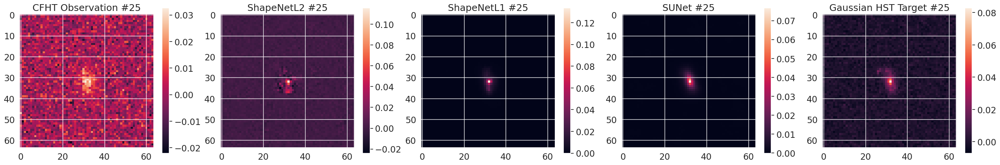

Max of CFHT 0.03261646
Max of ShapeNetL1 0.11554941
Max of ShapenetL2 0.13353124


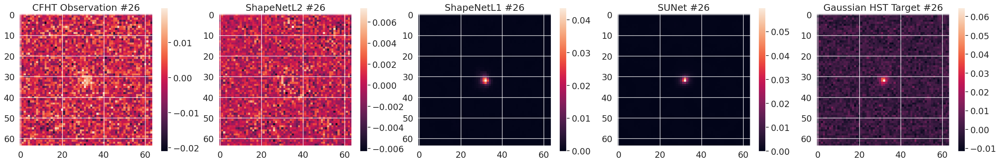

Max of CFHT 0.01992314
Max of ShapeNetL1 0.0073471623
Max of ShapenetL2 0.043673452


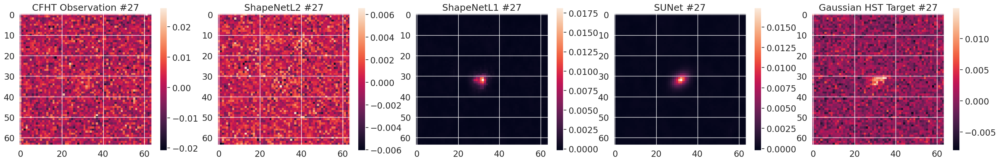

Max of CFHT 0.026252711
Max of ShapeNetL1 0.0065944022
Max of ShapenetL2 0.018147562


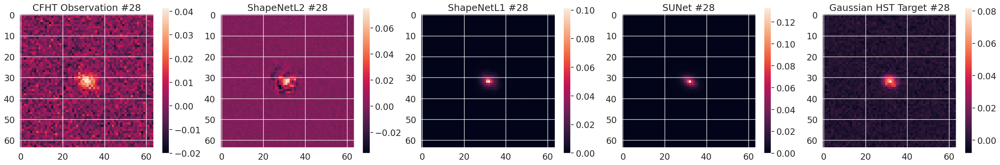

Max of CFHT 0.04137727
Max of ShapeNetL1 0.07525586
Max of ShapenetL2 0.1014096


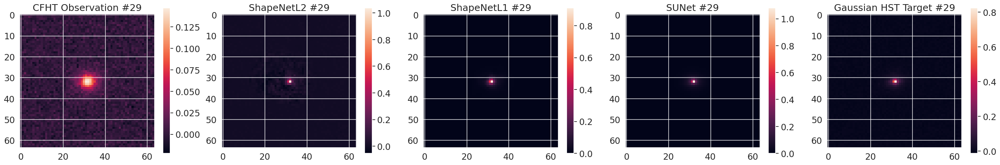

Max of CFHT 0.14708044
Max of ShapeNetL1 1.0372082
Max of ShapenetL2 0.9109853


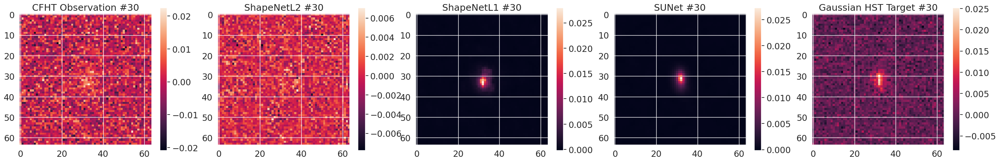

Max of CFHT 0.022520281
Max of ShapeNetL1 0.007060259
Max of ShapenetL2 0.027951851


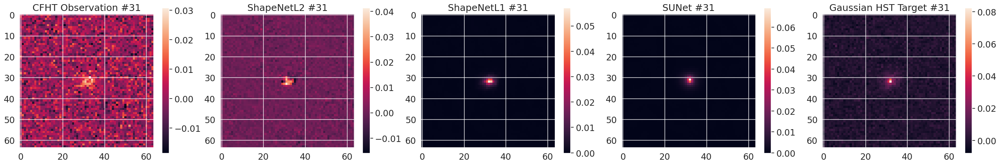

Max of CFHT 0.030732488
Max of ShapeNetL1 0.04138091
Max of ShapenetL2 0.05706395


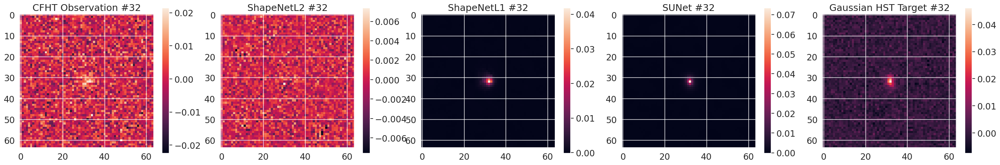

Max of CFHT 0.021418625
Max of ShapeNetL1 0.0073756236
Max of ShapenetL2 0.041799787


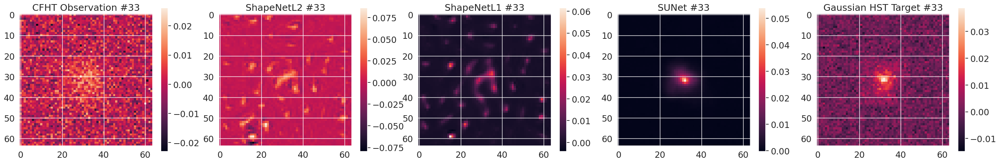

Max of CFHT 0.026149103
Max of ShapeNetL1 0.08630786
Max of ShapenetL2 0.061488837


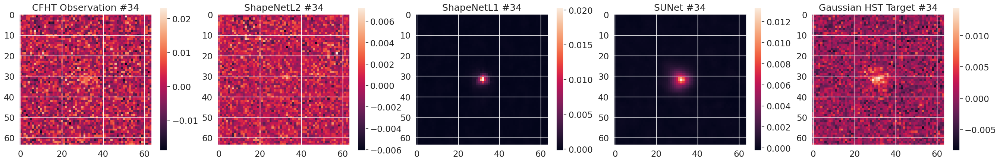

Max of CFHT 0.023158161
Max of ShapeNetL1 0.0072557363
Max of ShapenetL2 0.020295627


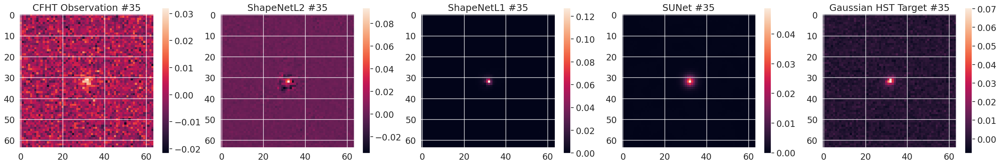

Max of CFHT 0.032038603
Max of ShapeNetL1 0.09357394
Max of ShapenetL2 0.12722674


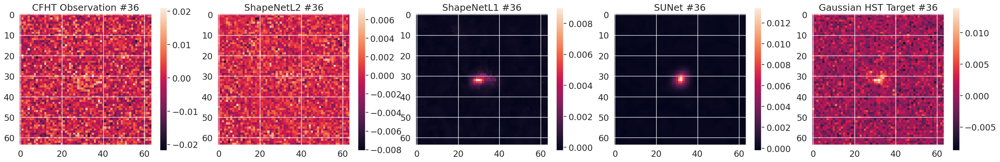

Max of CFHT 0.021019751
Max of ShapeNetL1 0.007279459
Max of ShapenetL2 0.009004329


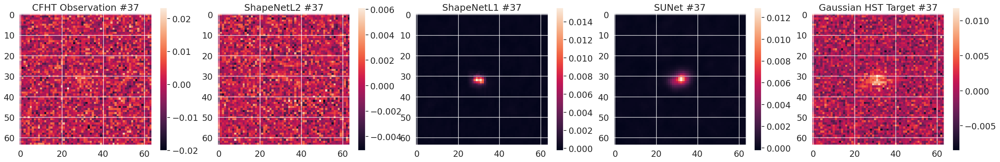

Max of CFHT 0.023206934
Max of ShapeNetL1 0.006116159
Max of ShapenetL2 0.015530193


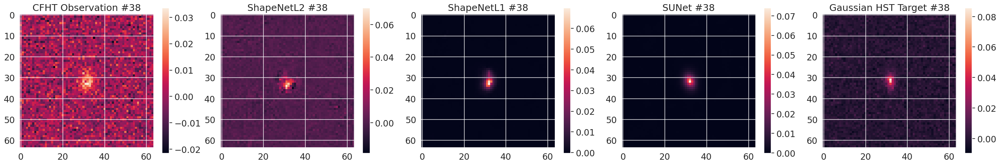

Max of CFHT 0.0335278
Max of ShapeNetL1 0.0700633
Max of ShapenetL2 0.06982836


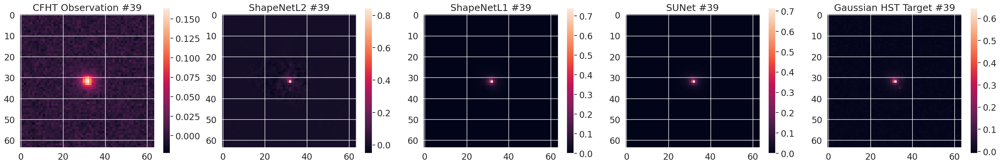

Max of CFHT 0.16382954
Max of ShapeNetL1 0.8455562
Max of ShapenetL2 0.73980016


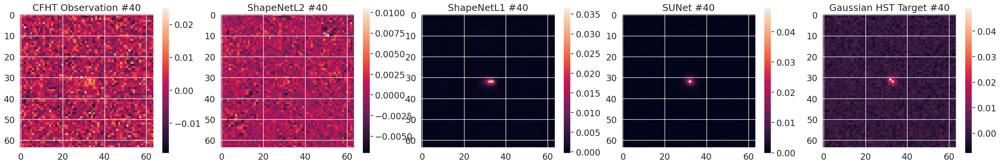

Max of CFHT 0.024995515
Max of ShapeNetL1 0.010540402
Max of ShapenetL2 0.036554646


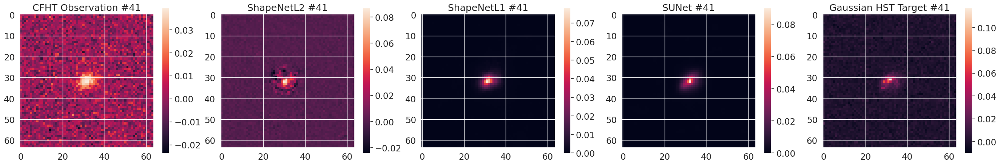

Max of CFHT 0.039436568
Max of ShapeNetL1 0.0869859
Max of ShapenetL2 0.0780254


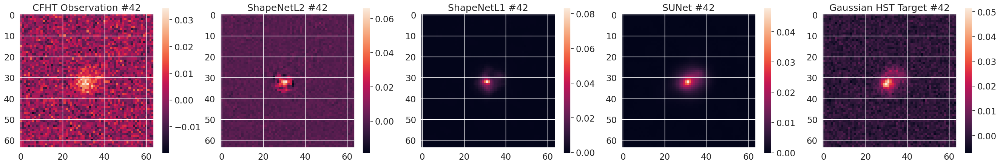

Max of CFHT 0.034398045
Max of ShapeNetL1 0.06614259
Max of ShapenetL2 0.08333287


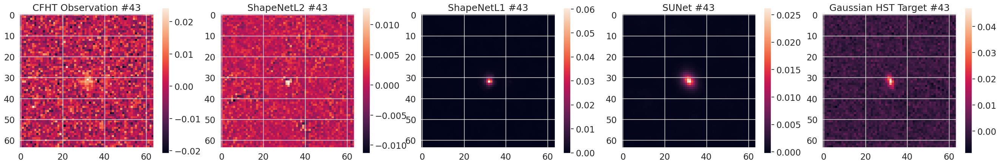

Max of CFHT 0.024245057
Max of ShapeNetL1 0.012776362
Max of ShapenetL2 0.06040071


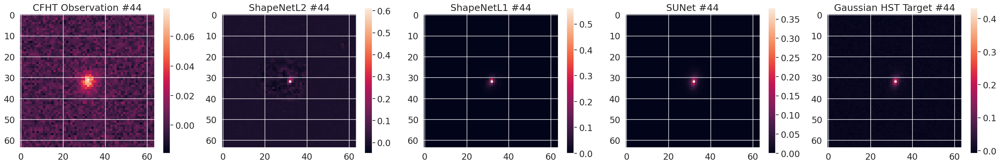

Max of CFHT 0.07921422
Max of ShapeNetL1 0.61241275
Max of ShapenetL2 0.5618852


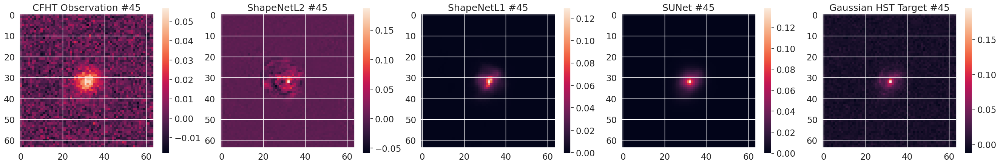

Max of CFHT 0.056807358
Max of ShapeNetL1 0.1874871
Max of ShapenetL2 0.12901407


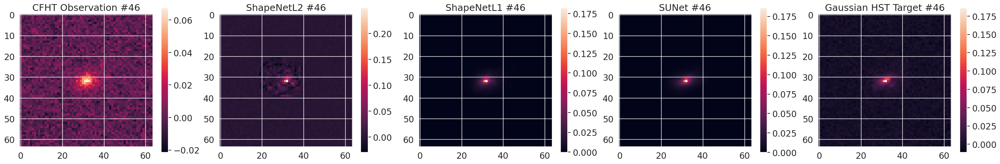

Max of CFHT 0.06744047
Max of ShapeNetL1 0.24904138
Max of ShapenetL2 0.1822197


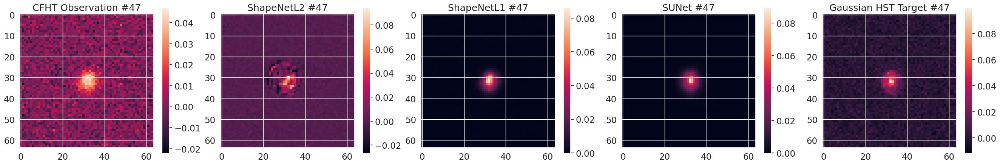

Max of CFHT 0.047019266
Max of ShapeNetL1 0.09425281
Max of ShapenetL2 0.08604269


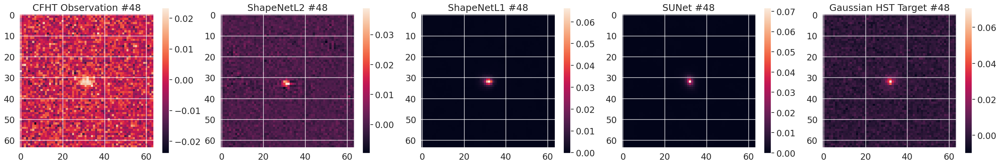

Max of CFHT 0.02331347
Max of ShapeNetL1 0.038888853
Max of ShapenetL2 0.06632525


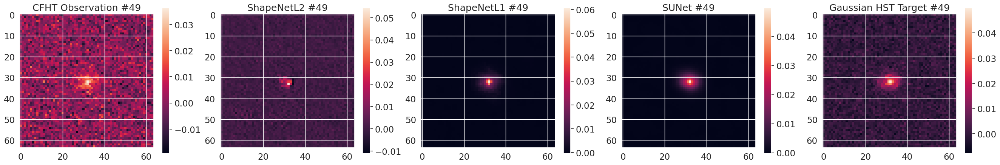

Max of CFHT 0.036338273
Max of ShapeNetL1 0.054347128
Max of ShapenetL2 0.06057917


In [7]:
# set seaborn theme and style
sns.set_theme()
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

for i in range(50):#n_batch):
    plt.figure(33,figsize=(40,5))
    plt.subplot(161)
    plt.imshow(batch['inputs'][window_flags][i])
    plt.title('CFHT Observation #{}'.format(i))
    plt.colorbar()
    plt.subplot(162)
    plt.imshow(res_np[window_flags][i])
    plt.title(r'ShapeNetL2 #{}'.format(i))
    plt.colorbar()
    plt.subplot(163)
    plt.imshow(res_g05_np[window_flags][i])
    plt.title(r'ShapeNetL1 #{}'.format(i))
    plt.colorbar()
    plt.subplot(164)
    plt.imshow(SUNet_g0[window_flags][i])
    plt.title(r'SUNet #{}'.format(i))
    plt.colorbar()
    plt.subplot(165)
    plt.imshow(batch['targets'][window_flags][i])
    plt.title('Gaussian HST Target #{}'.format(i))
    plt.colorbar()
    plt.show()
    
    print("Max of CFHT", np.max(batch['inputs'][window_flags][i]))
    print("Max of ShapeNetL1", np.max(res_np[window_flags][i]))
    print("Max of ShapenetL2", np.max(res_g05_np[window_flags][i]))

# Plot Failed Galaxy Images

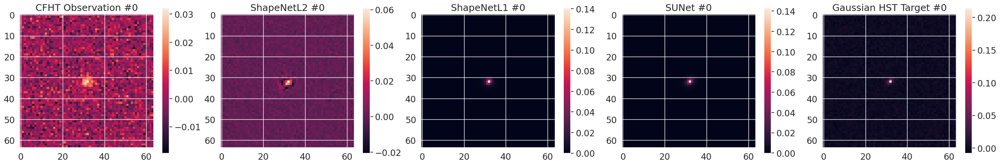

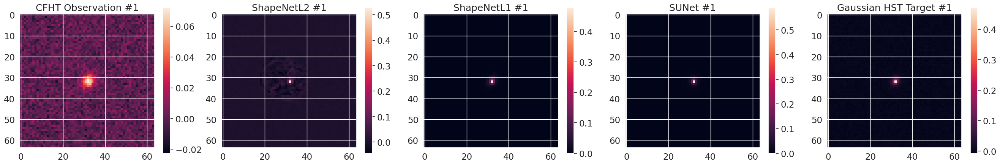

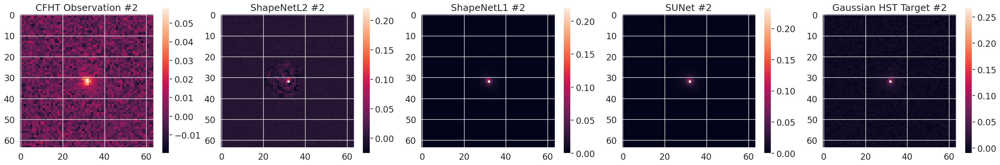

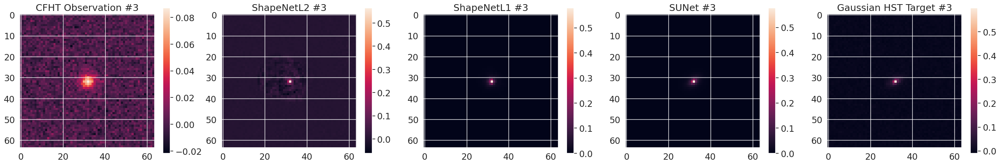

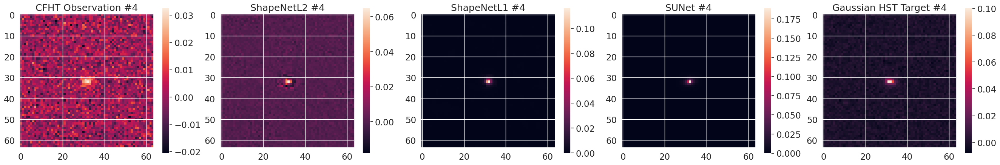

...

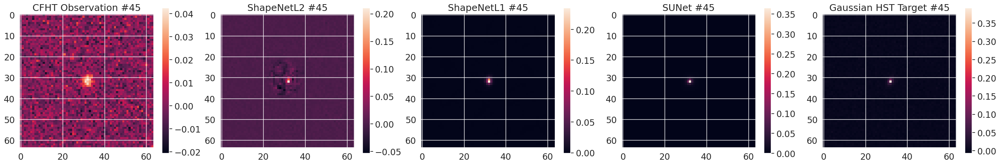

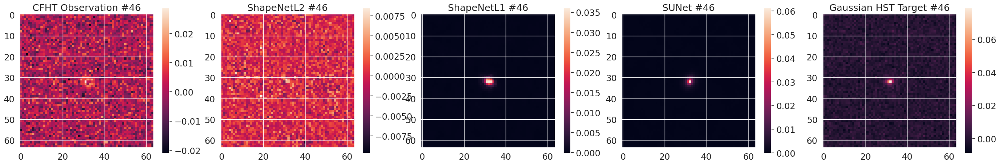

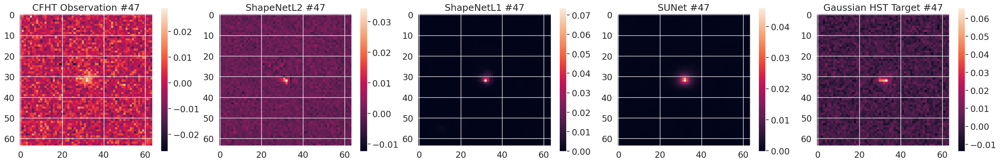

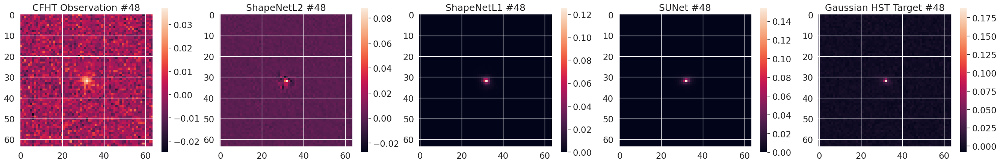

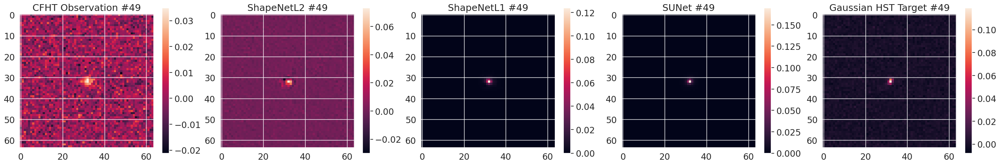

In [8]:
# set seaborn theme and style
sns.set_theme()
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

for i in range(50):#n_batch):
    plt.figure(33,figsize=(40,5))
    plt.subplot(161)
    plt.imshow(batch['inputs'][np.logical_not(window_flags)][i])
    plt.title('CFHT Observation #{}'.format(i))
    plt.colorbar()
    plt.subplot(162)
    plt.imshow(res_np[np.logical_not(window_flags)][i])
    plt.title(r'ShapeNetL2 #{}'.format(i))
    plt.colorbar()
    plt.subplot(163)
    plt.imshow(res_g05_np[np.logical_not(window_flags)][i])
    plt.title(r'ShapeNetL1 #{}'.format(i))
    plt.colorbar()
    plt.subplot(164)
    plt.imshow(SUNet_g0[np.logical_not(window_flags)][i])
    plt.title(r'SUNet #{}'.format(i))
    plt.colorbar()
    plt.subplot(165)
    plt.imshow(batch['targets'][np.logical_not(window_flags)][i])
    plt.title('Gaussian HST Target #{}'.format(i))
    plt.colorbar()
    plt.show()

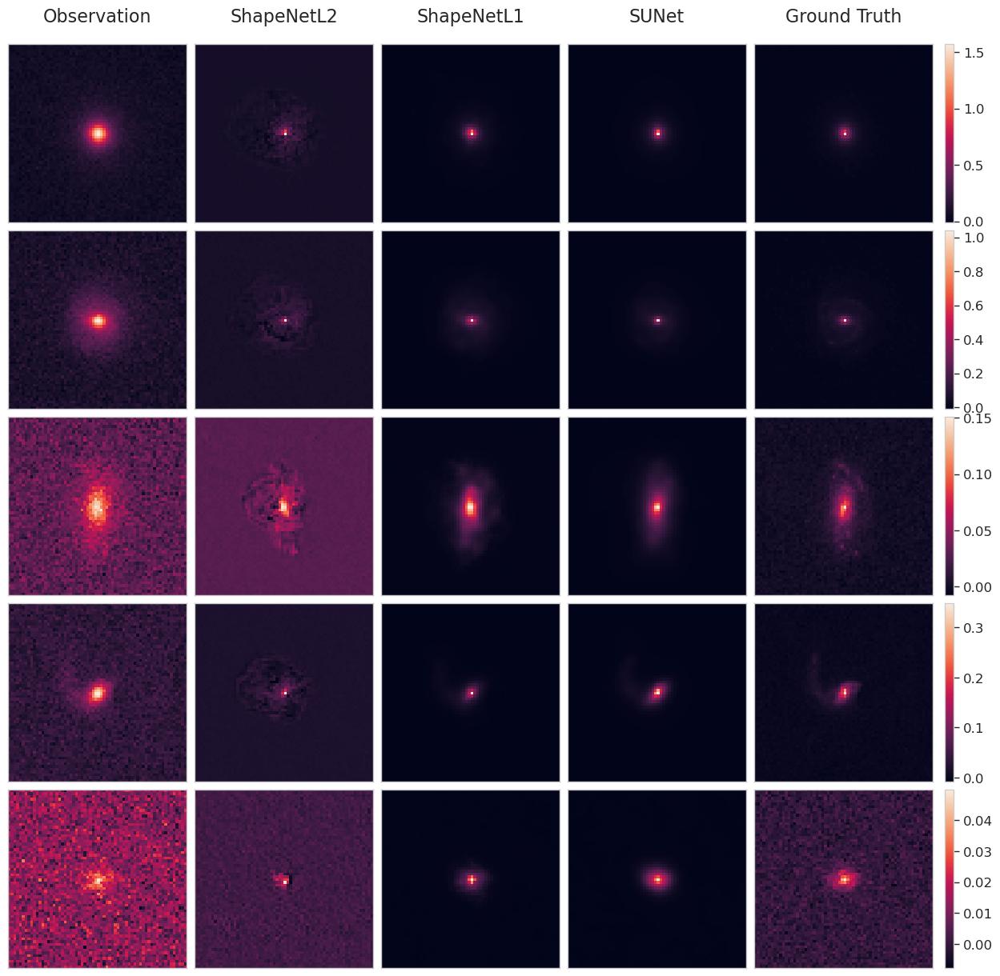

In [10]:
from mpl_toolkits.axes_grid1 import ImageGrid
sns.set_theme()
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 2.5})
# remove grid from images
sns.set_style("whitegrid", {'axes.grid': False})

# Prepare data
list_im = []
indices = [2, 3, 5, 21, 49]  # Your specific indices

for i in indices:
    # Add images in order: Observation, ShapeNetL2, ShapeNetL1, SUNet, Ground Truth
    list_im.append(batch['inputs'][window_flags][i])
    list_im.append(res_np[window_flags][i])
    list_im.append(res_g05_np[window_flags][i])
    list_im.append(SUNet_g0[window_flags][i])
    list_im.append(batch['targets'][window_flags][i])

# Create the figure with ImageGrid
fig = plt.figure(figsize=(20, 15))  # Wider to accommodate colorbars
grid = ImageGrid(fig, 111,
                 nrows_ncols=(5, 5),  # 5 rows, 5 columns
                 axes_pad=0.1,  # Padding between images
                 cbar_mode="edge",  # Colorbar on the edge
                 cbar_location="right",
                 cbar_size="5%",
                 cbar_pad=0.15,
                 )

# Plot images - remove all numbering but keep the images
for ax, im in zip(grid, list_im):
    im_plot = ax.imshow(im)
    # Remove all ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Add colorbars for each row
for row in range(5):
    # Get the last image in each row (rightmost column)
    last_ax_in_row = grid[4 + row*5]  # 4th index in each row (0-based)
    im_plot = last_ax_in_row.images[0]  # Get the image plot object
    grid.cbar_axes[row].colorbar(im_plot)
    grid.cbar_axes[row].tick_params(labelsize=12)

# Add column titles to the first row only
column_titles = ['Observation', 'ShapeNetL2', 'ShapeNetL1', 'SUNet', 'Ground Truth']
for i, title in enumerate(column_titles):
    grid[i].set_title(title, fontsize=16, pad=20)

plt.savefig('cfht2hst_images_unflagged.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [11]:
#---------------------------

### Save Samples

In [12]:
# choose 5 unflagged galaxies (successful moments estimation)
i_s = [1,3,4,23,42]
# choose 5 flagged galaxies (failed moments estimation)
i_f = [6,7,8,12,14]

keys = ['inputs', 
        'inputs_tikho',
        'targets',
        'psf_cfht',
        'mag_auto',
        'flux_radius',
        'SUNet',
        'ShapeNetL2',
        'ShapeNetL1',
        'tikhonet_sc']
values = [batch['inputs'],
          batch['inputs_tikho'],
          batch['targets'],
          batch['psf_cfht'],
          batch['mag_auto'],
          batch['flux_radius'],
          SUNet_g0,
          res_np,
          res_g05_np]


examples = {}

examples['flagged'] = {}
examples['unflagged'] = {}

# Initialize dictionaries for each key first
for key in keys:
    examples['flagged'][key] = {}
    examples['unflagged'][key] = {}

for key, value in zip(keys, values):
    for i in range(len(i_f)):
        examples['flagged'][key][i] = value[np.logical_not(window_flags)][i_f[i]]
        examples['unflagged'][key][i] = value[window_flags][i_s[i]]

In [13]:
# save dictionnary
f = open(data_path+"cfht_examples.pkl","wb")
pickle.dump(examples,f)
f.close()

In [14]:
f = open(data_path+"cfht_examples.pkl", "rb")
test = pickle.load(f)
f.close()